# Pipeline Sistem ALL

#### Workflow

Ambil Gambar -> ROI Cropping -> Restoration -> Color Correction -> Pre-processing (Resize, Binary Masking, Augment, dst.) -> Input ke model UNBCSM

### Library Uses

In [1]:
import cv2
import matplotlib.pyplot as plt
import os
import rawpy
import numpy as np

## #1 ROI Cropping + Restoration

### Define Model Haar Cascade & Image Ori Path

In [25]:
eye_cascade = cv2.CascadeClassifier(r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\notebooks\haarcascade_eye.xml')

img_path = r"C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Dataset Preliminary\buat cc\Validasi CC 3.dng"

Memproses gambar: C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Dataset Preliminary\buat cc\Validasi CC 3.dng
Ukuran gambar asli: (4624, 3468, 3)


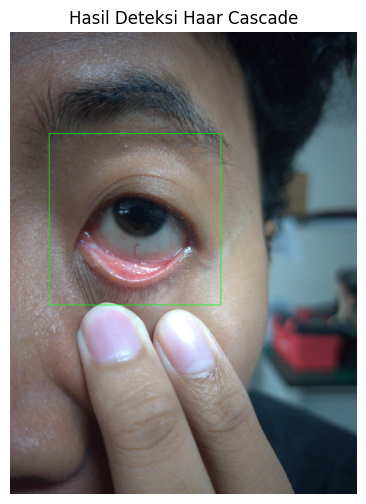

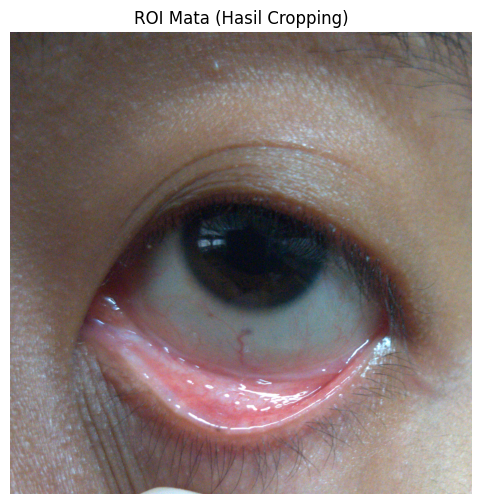

Ukuran Gambar setelah di-Crop : (1716, 1716, 3)


In [26]:
if not os.path.exists(img_path):
    print(f"Error: Gambar '{img_path}' tidak ditemukan di direktori saat ini.")
else:
    print(f"Memproses gambar: {img_path}")
    
    with rawpy.imread(img_path) as raw:
        # dimiripin nanti sama penggunaan di color correction
        img_rgb = raw.postprocess(use_camera_wb=True, exp_shift=1.0)

    img = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)

    # 1. Konversi ke Grayscale (Haar Cascade WAJIB menggunakan citra abu-abu untuk deteksi)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # 2. Deteksi Mata
    # Fungsi ini akan mereturn array berisi [x, y, width, height] dari kotak pembatas
    eyes = eye_cascade.detectMultiScale(
        gray, 
        scaleFactor=1.1,  # Menentukan seberapa besar gambar diperkecil setiap iterasi (1.1 = 10%)
        minNeighbors=3,   # Menentukan jumlah kotak tetangga agar area divalidasi sebagai mata
        minSize=(50, 50)  # Ukuran minimum objek. Diperbesar agar tidak salah deteksi noise kecil
    )
    
    # 3. Proses Hasil Deteksi dan Cropping
    if len(eyes) > 0:
        # Kita looping (meskipun biasanya kita hanya butuh 1 mata untuk dianalisis)
        for (x, y, w, h) in eyes:
            
            # --- VISUALISASI BOUNDING BOX ---
            # Salin gambar asli agar gambar original tidak tertimpa garis kotak
            img_dengan_kotak = img.copy()
            # Gambar kotak hijau (0, 255, 0) dengan ketebalan garis 5
            cv2.rectangle(img_dengan_kotak, (x, y), (x+w, y+h), (0, 255, 0), 5)
            img_dengan_kotak = cv2.cvtColor(img_dengan_kotak, cv2.COLOR_BGR2RGB)  # Konversi ke RGB untuk Matplotlib
            print(f"Ukuran gambar asli: {img.shape}")
            plt.figure(figsize=(8, 6))
            plt.imshow(img_dengan_kotak)
            plt.title("Hasil Deteksi Haar Cascade")
            plt.axis('off')
            plt.show()
            
            # --- PROSES CROPPING (ROI) ---
            # Memotong gambar menggunakan Numpy Slicing: array[startY:endY, startX:endX]
            roi_mata = img[y:y+h, x:x+w]
            roi_mata = cv2.cvtColor(roi_mata, cv2.COLOR_BGR2RGB)  # Konversi ke RGB untuk Matplotlib
            plt.figure(figsize=(8, 6))
            plt.imshow(roi_mata)
            plt.title("ROI Mata (Hasil Cropping)")
            plt.axis('off')
            plt.show()
            print(f"Ukuran Gambar setelah di-Crop : {roi_mata.shape}")
            
            # Kita 'break' karena kita hanya ingin memproses mata pertama yang terdeteksi
            break
            
    else:
        print("Mata tidak terdeteksi oleh Haar Cascade.")
        print("Saran: Coba turunkan nilai 'minNeighbors' (misal: 3) atau 'scaleFactor' (misal: 1.05).")

### Image Restoration (Inpainting)

Pusat kecerahan untuk 5 klaster: [200, 158, 126, 92, 44]
Klaster paling terang ada di nilai: 200
-> Silau terdeteksi! Membuat masking...
-> Silau flash tervalidasi! Membuat masking presisi...


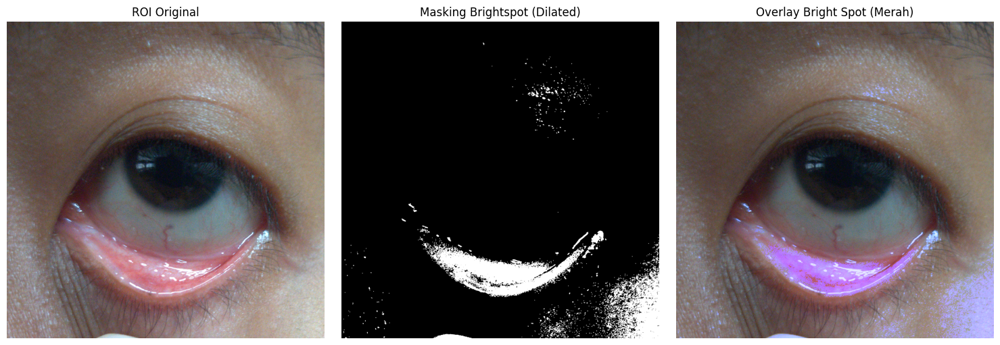

In [29]:
hsv_img = cv2.cvtColor(roi_mata, cv2.COLOR_BGR2HSV)
v_channel = hsv_img[:, :, 2]
s_channel = hsv_img[:, :, 1]

# 2. Persiapkan data untuk K-Means (Ubah matriks 2D menjadi 1D list piksel)
pixel_values = v_channel.reshape((-1, 1))
pixel_values = np.float32(pixel_values)

# 3. Konfigurasi K-Means
#k = 3 # Membagi menjadi 3 kelompok: Gelap, Sedang, Terang
k = 5
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

# Jalankan K-Means
_, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# 4. Cari kelompok yang paling terang
brightest_cluster_idx = np.argmax(centers)
brightest_center_value = centers[brightest_cluster_idx][0]

print(f"Pusat kecerahan untuk {k} klaster: {[int(c[0]) for c in centers]}")
print(f"Klaster paling terang ada di nilai: {int(brightest_center_value)}")

# 5. SAFEGUARD: Apakah ini benar-benar silau?
# Angka 200 adalah threshold kecerahan (0-255). Bisa disesuaikan.
if brightest_center_value > 190:
    print("-> Silau terdeteksi! Membuat masking...")
    
    # Buat Masking Hitam-Putih
    mask_silau = np.zeros(v_channel.shape, dtype=np.uint8)
    mask_flat = mask_silau.flatten()
    v_flat = v_channel.flatten()
    s_flat = s_channel.flatten()

    mask_flat[(labels.flatten() == brightest_cluster_idx) & (v_flat > 200) & (s_flat < 110)] = 255
    mask_silau = mask_flat.reshape(v_channel.shape)
    
    # Cek apakah setelah diverifikasi saturasi, ternyata tidak ada piksel yang lolos (mask kosong)
    if cv2.countNonZero(mask_silau) == 0:
        print("-> Batal: Area terang memiliki warna (saturasi tinggi), bukan silau flash. Masking dikosongkan.")
        mask_silau_dilated = mask_silau
    else:
        print("-> Silau flash tervalidasi! Membuat masking presisi...")
        # 6. Dilation (Pelebaran Masking)
        kernel = np.ones((3, 3), np.uint8) 
        mask_silau_dilated = cv2.dilate(mask_silau, kernel, iterations=1)

    # 7. Pembuatan Overlay Visualisasi
    # Membuat canvas merah kosong dengan ukuran sama seperti ROI
    overlay_merah = np.zeros_like(roi_mata)
    overlay_merah[:] = (0, 0, 255) # Warna Merah dalam format BGR
    
    # Terapkan masking hitam-putih pada canvas merah (hanya menyisakan merah di area silau)
    mask_berwarna = cv2.bitwise_and(overlay_merah, overlay_merah, mask=mask_silau_dilated)
    
    # Gabungkan gambar original dengan mask merah transparan (0.7 untuk original, 0.5 untuk merah)
    roi_overlay = cv2.addWeighted(roi_mata, 0.9, mask_berwarna, 0.7, 0)
    
    # Tampilkan 3 gambar berdampingan
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    #axes[0].imshow(cv2.cvtColor(roi_mata, cv2.COLOR_BGR2RGB))
    axes[0].imshow(roi_mata)
    axes[0].set_title("ROI Original")
    axes[0].axis('off')
    
    axes[1].imshow(mask_silau_dilated, cmap='gray')
    axes[1].set_title("Masking Brightspot (Dilated)")
    axes[1].axis('off')
    
    #axes[2].imshow(cv2.cvtColor(roi_overlay, cv2.COLOR_BGR2RGB))
    axes[2].imshow(roi_overlay)
    axes[2].set_title("Overlay Bright Spot (Merah)")
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()

else:
    print("-> Klaster terang nilainya di bawah threshold (Tidak ada silau dominan).")
    # Buat mask kosong (hitam semua) agar proses selanjutnya tetap berjalan tanpa mengubah gambar
    mask_silau_dilated = np.zeros(v_channel.shape, dtype=np.uint8)
    
    plt.imshow(mask_silau_dilated, cmap='gray')
    plt.title("Masking Kosong (Tidak ada silau)")
    plt.axis('off')
    plt.show()

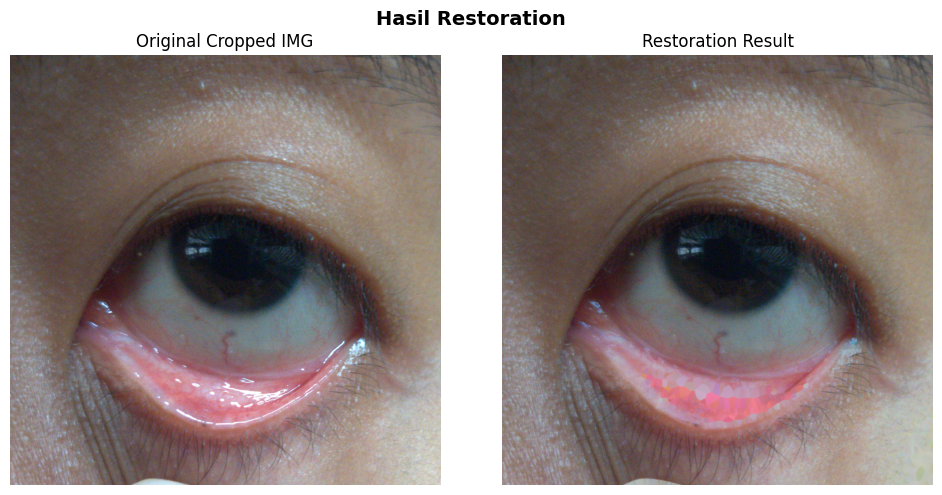

Proses Bright Spot Denoising Selesai! Gambar siap dimasukkan ke UNBCSM.


In [30]:
radius_penambalan = 3 # Seberapa jauh area sekitar yang diambil untuk interpolasi
roi_bersih = cv2.inpaint(roi_mata, mask_silau_dilated, radius_penambalan, cv2.INPAINT_TELEA)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle("Hasil Restoration", fontsize=14, fontweight='bold')

axes[0].imshow(roi_mata)
axes[0].set_title("Original Cropped IMG")
axes[0].axis('off')

axes[1].imshow(roi_bersih)
axes[1].set_title("Restoration Result")
axes[1].axis('off')

plt.tight_layout()
plt.show()

print("Proses Bright Spot Denoising Selesai! Gambar siap dimasukkan ke UNBCSM.")

## #2 Color Correction

### Library Uses

In [15]:
import numpy as np
import cv2
import rawpy
import sys
import os
import pickle
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures

jalur_utama = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA'
if jalur_utama not in sys.path:
    sys.path.append(jalur_utama)

from scripts.reference_values import referenceColor
from scripts.ColorCorrectionML import ColorCorrectionML

INDEKS_KONJUNGTIVA = [1, 8, 14, 16] 
NAMA_PATCH = ["Light Skin", "Mod. Red", "Red", "Magenta"]

### Model Training with Each Patch of Coior Checker

In [31]:
path_cc = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Dataset Preliminary\buat cc\CC 3.dng'

with rawpy.imread(path_cc) as raw:
    rgb_cc = raw.postprocess(use_camera_wb=True, exp_shift=1.0)

bgr_cc = cv2.cvtColor(rgb_cc, cv2.COLOR_RGB2BGR)

cc_ml = ColorCorrectionML(bgr_cc, chart='Classic', illuminant='D50')
src_awal, _, _ = cc_ml.extract_color_chart()

# Latih Model Regresi PLS
print("Melatih model PLS...")
degree = 3

model_pls, _ = cc_ml.compute_correction(
    show=False, 
    method='pls', 
    degree=degree, 
    interactions_only=False, 
    ncomp=10
)

poly = PolynomialFeatures(degree=degree, interaction_only=False)

src_transformed = poly.fit_transform(src_awal)
src_akhir = np.clip(model_pls.predict(src_transformed), 0, 255)

patch_sebelum = src_awal[INDEKS_KONJUNGTIVA]
patch_sesudah = src_akhir[INDEKS_KONJUNGTIVA]
patch_referensi = cc_ml.reference[INDEKS_KONJUNGTIVA]

dE_all_sesudah = ColorCorrectionML.DeltaE(src_akhir, cc_ml.reference)[2]
dE_konj_sesudah = ColorCorrectionML.DeltaE(patch_sesudah, patch_referensi)[2]

print(f"Final Mean Delta E (24 Patch Keseluruhan) : {dE_all_sesudah:.4f}")
print(f"Final Mean Delta E (4 Patch Konjungtiva)  : {dE_konj_sesudah:.4f}")
print("Model Training Finished")

Melatih model PLS...
Initial mean DeltaE:  10.1142911013
Number of components:  10
Final Mean Delta E (24 Patch Keseluruhan) : 3.0371
Final Mean Delta E (4 Patch Konjungtiva)  : 2.7812
Model Training Finished


### Numerical Evaluation

In [32]:
dE_sebelum = ColorCorrectionML.DeltaE(patch_sebelum, patch_referensi)[2]
dE_sesudah = ColorCorrectionML.DeltaE(patch_sesudah, patch_referensi)[2]

print(f"Mean Delta E (Sebelum Koreksi) : {dE_sebelum:.4f}")
print(f"Mean Delta E (Sesudah Koreksi) : {dE_sesudah:.4f}\n")

print(f"{'Nama Patch':<12} | {'Referensi Ideal':<16} | {'Sebelum (Kamera)':<16} | {'Sesudah (ML)':<16} | {'Selisih (Ref - ML)':<18}")
print("-" * 85)

for i in range(len(INDEKS_KONJUNGTIVA)):
    nama = NAMA_PATCH[i]
    ref = np.round(patch_referensi[i]).astype(int)
    seb = np.round(patch_sebelum[i]).astype(int)
    ses = np.round(patch_sesudah[i]).astype(int)
    diff = np.abs(ref - ses)
    
    ref_str = f"[{ref[0]:>3}, {ref[1]:>3}, {ref[2]:>3}]"
    seb_str = f"[{seb[0]:>3}, {seb[1]:>3}, {seb[2]:>3}]"
    ses_str = f"[{ses[0]:>3}, {ses[1]:>3}, {ses[2]:>3}]"
    diff_str = f"[{diff[0]:>3}, {diff[1]:>3}, {diff[2]:>3}]"
    print(f"{nama:<12} | {ref_str:<16} | {seb_str:<16} | {ses_str:<16} | {diff_str:<18}")

Mean Delta E (Sebelum Koreksi) : 12.7969
Mean Delta E (Sesudah Koreksi) : 2.7812

Nama Patch   | Referensi Ideal  | Sebelum (Kamera) | Sesudah (ML)     | Selisih (Ref - ML)
-------------------------------------------------------------------------------------
Light Skin   | [195, 149, 128]  | [201, 157, 143]  | [182, 133, 116]  | [ 13,  16,  12]   
Mod. Red     | [194,  84,  97]  | [254, 124, 141]  | [197,  87,  97]  | [  3,   3,   0]   
Red          | [175,  50,  57]  | [234,  95,  96]  | [182,  62,  67]  | [  7,  12,  10]   
Magenta      | [188,  84, 150]  | [232, 120, 210]  | [186,  78, 147]  | [  2,   6,   3]   


### Visualizing Evaluation

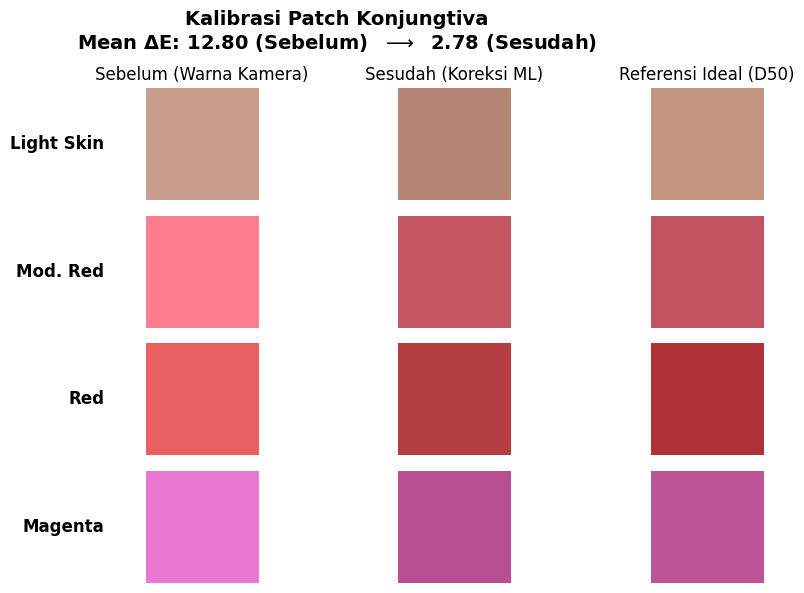

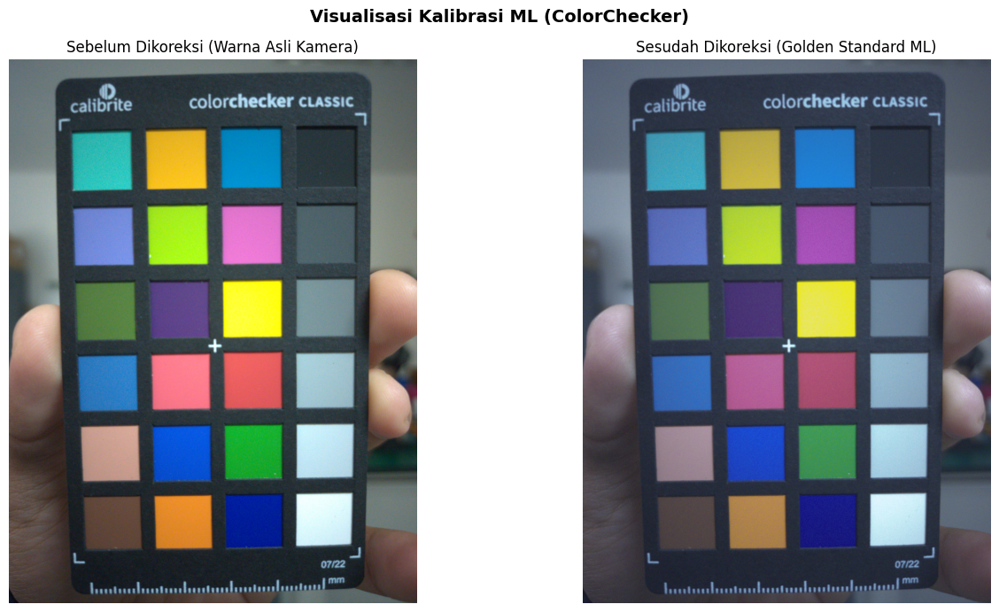

In [33]:
# =================================================================
# VISUALISASI PATCH KONJUNGTIVA (VERSI RAPI)
# =================================================================
fig_patch, axes_patch = plt.subplots(len(INDEKS_KONJUNGTIVA), 3, figsize=(10, 6))
fig_patch.suptitle(f"Kalibrasi Patch Konjungtiva\nMean \u0394E: {dE_sebelum:.2f} (Sebelum)  $\longrightarrow$  {dE_sesudah:.2f} (Sesudah)", fontsize=14, fontweight='bold')

axes_patch[0, 0].set_title("Sebelum (Warna Kamera)")
axes_patch[0, 1].set_title("Sesudah (Koreksi ML)")
axes_patch[0, 2].set_title("Referensi Ideal (D50)")

for i in range(len(INDEKS_KONJUNGTIVA)):
    c_seb = np.clip(patch_sebelum[i] / 255.0, 0, 1)
    c_ses = np.clip(patch_sesudah[i] / 255.0, 0, 1)
    c_ref = np.clip(patch_referensi[i] / 255.0, 0, 1)

    # -----------------------------------------------------
    # KOLOM 1: SEBELUM (Dengan Label Nama Patch)
    # -----------------------------------------------------
    axes_patch[i, 0].imshow([[c_seb]])
    # Matikan angka koordinat (ticks) agar bersih
    axes_patch[i, 0].set_xticks([])
    axes_patch[i, 0].set_yticks([])
    # Hilangkan garis tepi (spines) agar terlihat seperti axis('off')
    for spine in axes_patch[i, 0].spines.values():
        spine.set_visible(False)
    # Gunakan ylabel untuk nama patch agar marginnya otomatis dan rapi
    axes_patch[i, 0].set_ylabel(NAMA_PATCH[i], rotation=0, labelpad=30, va='center', ha='right', fontsize=12, fontweight='bold')

    # -----------------------------------------------------
    # KOLOM 2: SESUDAH
    # -----------------------------------------------------
    axes_patch[i, 1].imshow([[c_ses]])
    axes_patch[i, 1].axis('off')

    # -----------------------------------------------------
    # KOLOM 3: REFERENSI D50
    # -----------------------------------------------------
    axes_patch[i, 2].imshow([[c_ref]])
    axes_patch[i, 2].axis('off')

# Optimasi margin agar label di sebelah kiri tidak terpotong
plt.tight_layout()
plt.subplots_adjust(left=0.25, top=0.85, wspace=0.1) 
plt.show()

# =================================================================
# VISUALISASI GAMBAR KESELURUHAN
# =================================================================
bgr_cc_corrected = cc_ml.correct_img(bgr_cc, show=False)
rgb_cc_corrected = cv2.cvtColor(bgr_cc_corrected, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(14, 7))
fig.suptitle("Visualisasi Kalibrasi ML (ColorChecker)", fontsize=14, fontweight='bold')

axes[0].imshow(cv2.cvtColor(bgr_cc, cv2.COLOR_BGR2RGB))
axes[0].set_title("Sebelum Dikoreksi (Warna Asli Kamera)")
axes[0].axis('off')

axes[1].imshow(rgb_cc_corrected)
axes[1].set_title("Sesudah Dikoreksi (Golden Standard ML)")
axes[1].axis('off')

plt.tight_layout()
plt.show()

### Save Weight Model

In [34]:
folder_tujuan = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\models\weights\Color Correction\Samsung A52s'
os.makedirs(folder_tujuan, exist_ok=True)
nama_file_model = os.path.join(folder_tujuan, 'weight_1.pkl')

with open(nama_file_model, 'wb') as f:
    pickle.dump({'model': model_pls, 'poly': poly}, f)

print(f"Weight ML telah disimpan di dalam folder:\n{folder_tujuan}")

Weight ML telah disimpan di dalam folder:
C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\models\weights\Color Correction\Samsung A52s


### Load Weight Model

In [35]:
folder_tujuan = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\models\weights\Color Correction\Samsung A52s'
nama_file_model = os.path.join(folder_tujuan, 'weight_1.pkl')

with open(nama_file_model, 'rb') as f:
    data_kalibrasi = pickle.load(f)

model_pls = data_kalibrasi['model']
poly = data_kalibrasi['poly']

print("Weight Model berhasil dimuat")

Weight Model berhasil dimuat


### Chunking - Color Correction

In [36]:
img = roi_bersih.copy()  # Pastikan kita bekerja dengan salinan agar gambar asli tetap utuh

h, w, c = img.shape
img_flat = img.reshape(-1, 3)

# Mengakali NotFittedError dengan memberikan dummy 1 piksel
poly.fit(img_flat[:1])

# Menggunakan wadah float32 untuk mencegah Integer Overflow
img_corrected_flat = np.zeros_like(img_flat, dtype=np.float32)
chunk_size = 1_000_000 

for i in range(0, len(img_flat), chunk_size):
    # Ubah potongan ke float32 sebelum masuk ke fungsi ML
    chunk = img_flat[i:i+chunk_size].astype(np.float32)
    
    chunk_poly = poly.transform(chunk)
    img_corrected_flat[i:i+chunk_size] = model_pls.predict(chunk_poly)

# Kembalikan ke format gambar normal dengan batas 0-255
img_corrected = np.clip(img_corrected_flat, 0, 255).astype(np.uint8).reshape(h, w, c)
#rgb_corrected = cv2.cvtColor(img_corrected, cv2.COLOR_BGR2RGB)
print("Color Correction selesai!")

Color Correction selesai!


Ukuran Gambar sebelum koreksi: (1716, 1716, 3)
Ukuran Gambar setelah koreksi: (1716, 1716, 3)


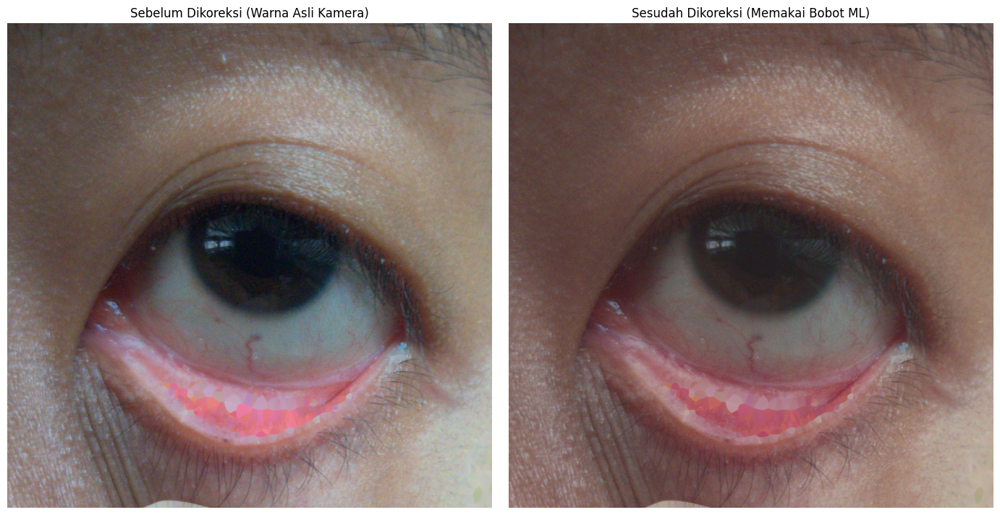

In [37]:
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

axes[0].imshow(img)
axes[0].set_title("Sebelum Dikoreksi (Warna Asli Kamera)")
axes[0].axis('off')

axes[1].imshow(img_corrected)
axes[1].set_title("Sesudah Dikoreksi (Memakai Bobot ML)")
axes[1].axis('off')

print(f"Ukuran Gambar sebelum koreksi: {img.shape}")
print(f"Ukuran Gambar setelah koreksi: {img_corrected.shape}")

plt.tight_layout()
plt.show()

## #3 Pre-Processing ALL

In [42]:
img_aug = img_corrected.copy()

### 1 - Binary Masking

### 2 - Resizing

Shape sebelum resize: (1716, 1716, 3)
Shape setelah resize: (512, 682, 3)


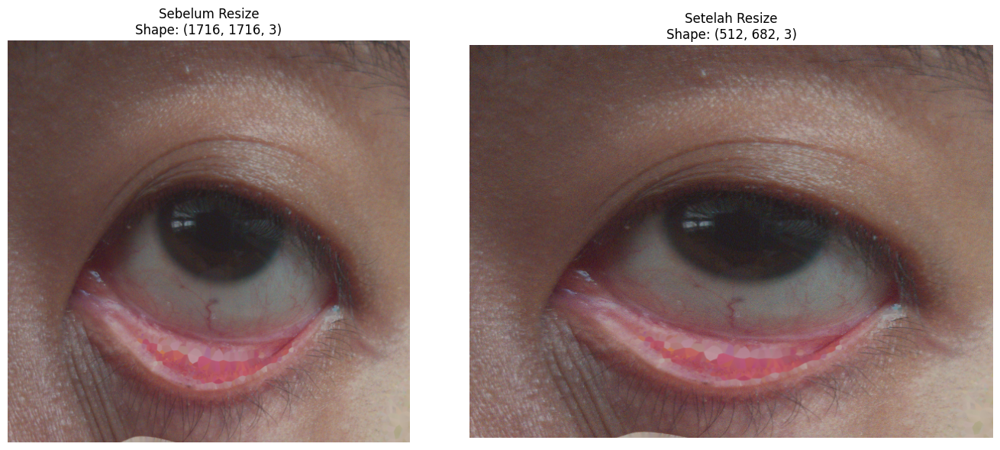

In [ ]:
print("Shape sebelum resize:", img_aug.shape)
resized_img = cv2.resize(img_aug, (682, 512), interpolation=cv2.INTER_LINEAR)
print("Shape setelah resize:", resized_img.shape)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].imshow(img_aug)
axes[0].set_title(f"Sebelum Resize\nShape: {img_aug.shape}")
axes[0].axis('off')

axes[1].imshow(resized_img)
axes[1].set_title(f"Setelah Resize\nShape: {resized_img.shape}")
axes[1].axis('off')

plt.tight_layout()
plt.show()

### 3 - Brightness Addition

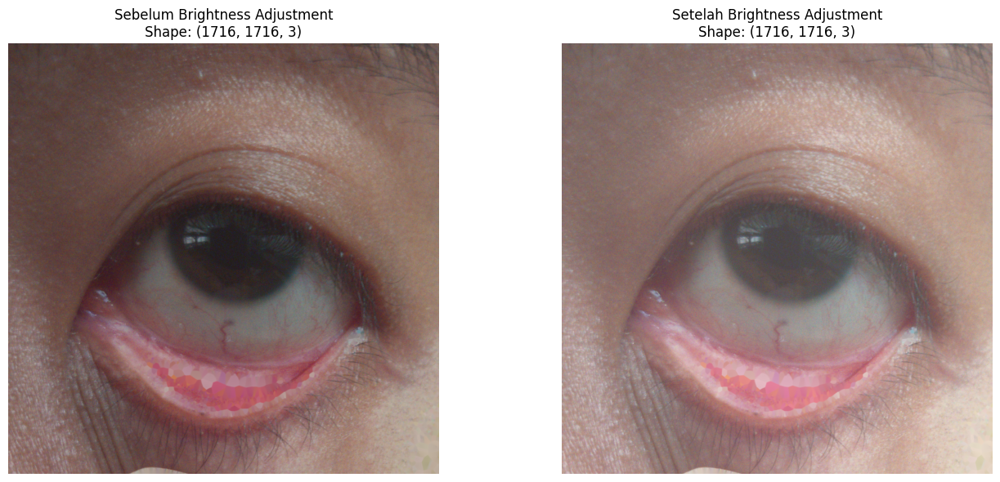

In [44]:
# Konversi ke float untuk menghindari error batas atas (255)
img_float = img_aug.astype(np.float32)
img_float += 40
# Pangkas nilai agar tetap berada di antara 0 dan 255
np.clip(img_float, 0, 255, out=img_float)
ba_result = img_float.astype(np.uint8)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].imshow(img_aug)
axes[0].set_title(f"Sebelum Brightness Adjustment\nShape: {img_aug.shape}")
axes[0].axis('off')

axes[1].imshow(ba_result)
axes[1].set_title(f"Setelah Brightness Adjustment\nShape: {ba_result.shape}")
axes[1].axis('off')

plt.tight_layout()
plt.show()

### 4 - Gaussian Blur

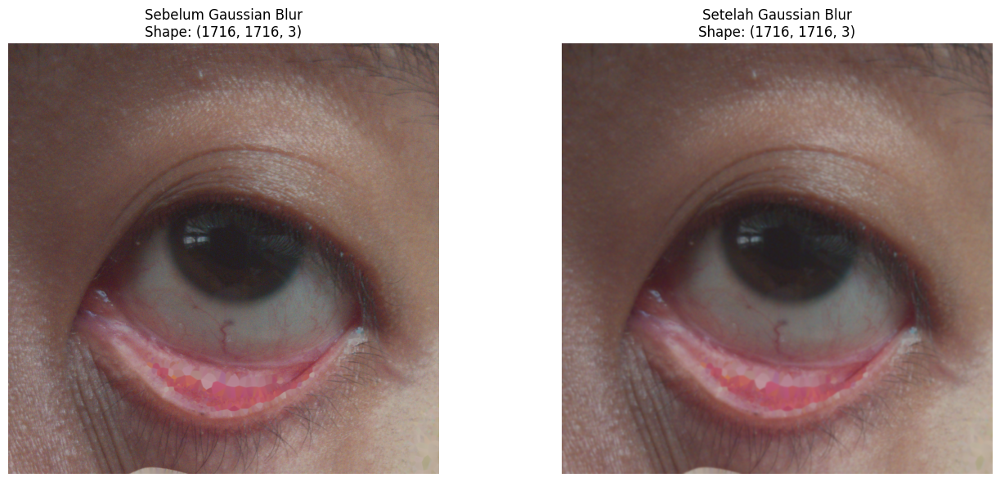

In [51]:
blur_img = cv2.GaussianBlur(img_aug, (15, 15), 0)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].imshow(img_aug)
axes[0].set_title(f"Sebelum Gaussian Blur\nShape: {img_aug.shape}")
axes[0].axis('off')

axes[1].imshow(blur_img)
axes[1].set_title(f"Setelah Gaussian Blur\nShape: {blur_img.shape}")
axes[1].axis('off')

plt.tight_layout()
plt.show()

### 5 - Rotation

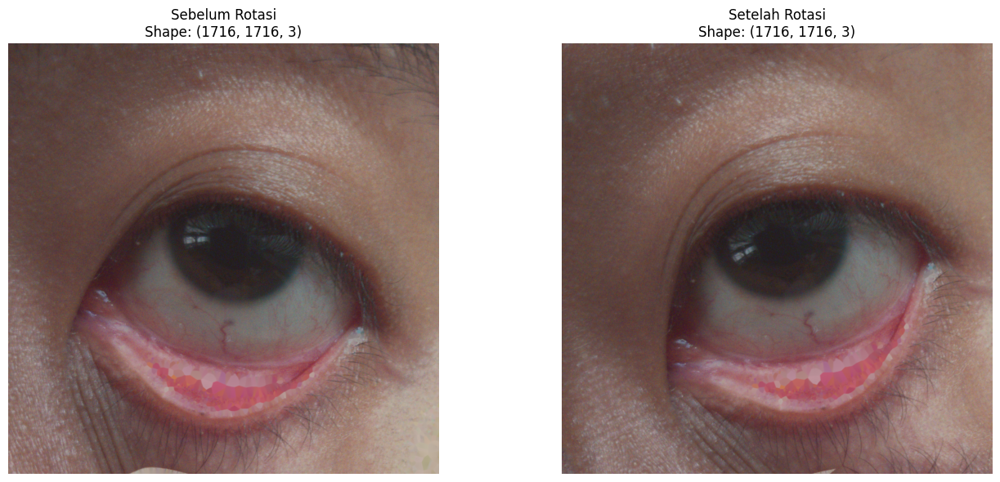

In [55]:
angle = 25

h, w = img_aug.shape[:2]
center = (w // 2, h // 2)
# Buat matriks rotasi
M = cv2.getRotationMatrix2D(center, angle, 1.0)

# Rotasi Gambar (Gunakan INTER_LINEAR agar gambar tetap halus, border direfleksikan agar tidak hitam)
rotated_img = cv2.warpAffine(img_aug, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].imshow(img_aug)
axes[0].set_title(f"Sebelum Rotasi\nShape: {img_aug.shape}")
axes[0].axis('off')

axes[1].imshow(rotated_img)
axes[1].set_title(f"Setelah Rotasi\nShape: {rotated_img.shape}")
axes[1].axis('off')

plt.tight_layout()
plt.show()

### 6 - Flipping

### 7 - Normalisasi